In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/ibm-hr-analytics-attrition-dataset/WA_Fn-UseC_-HR-Employee-Attrition.csv


In [2]:
#from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
from scipy import stats
from scipy.stats import pearsonr
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows',None)
import itertools
from sklearn.model_selection import train_test_split
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,roc_auc_score,roc_curve
from sklearn.model_selection import cross_val_score
from sklearn.tree import plot_tree
from xgboost import plot_tree,plot_importance
from sklearn import tree
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler

In [3]:
data=pd.read_csv("IBM_Employee.csv")
df=data.copy()
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


In [4]:
df.shape

(1470, 35)

In [5]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.00,3.0,4.00,5.0
EmployeeCount,1470.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.00,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.00,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.00,2.0,3.00,5.0


In [7]:
df.describe(include="object").T

,count,unique,top,freq
Attrition,1470,2,No,1233
BusinessTravel,1470,3,Travel_Rarely,1043
Department,1470,3,Research & Development,961
EducationField,1470,6,Life Sciences,606
Gender,1470,2,Male,882
JobRole,1470,9,Sales Executive,326
MaritalStatus,1470,3,Married,673
Over18,1470,1,Y,1470
OverTime,1470,2,No,1054


In [8]:
df=df.drop(columns=["Over18"],axis=1)

In [9]:
df.isnull().sum().to_frame()

,0
Age,0
Attrition,0
BusinessTravel,0
DailyRate,0
Department,0
DistanceFromHome,0
Education,0
EducationField,0
EmployeeCount,0
EmployeeNumber,0


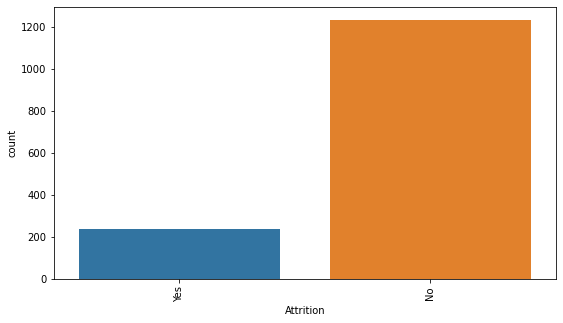

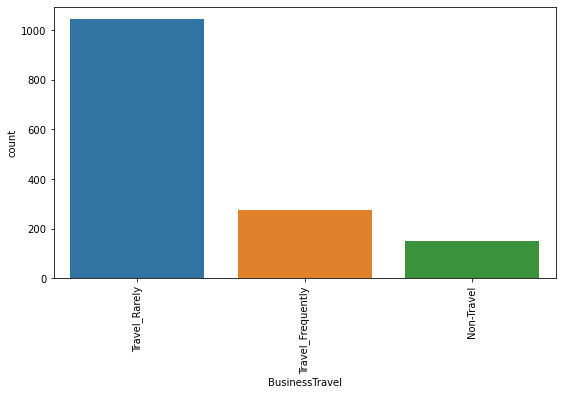

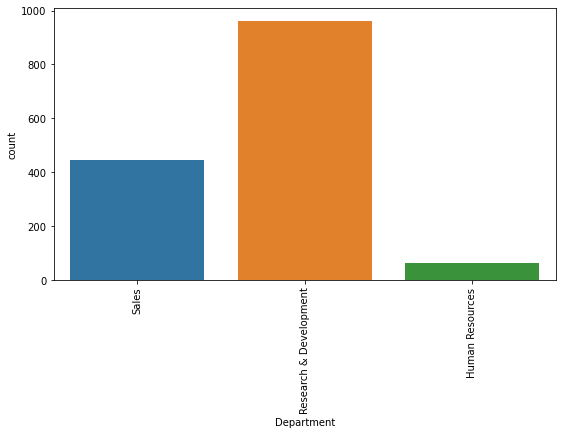

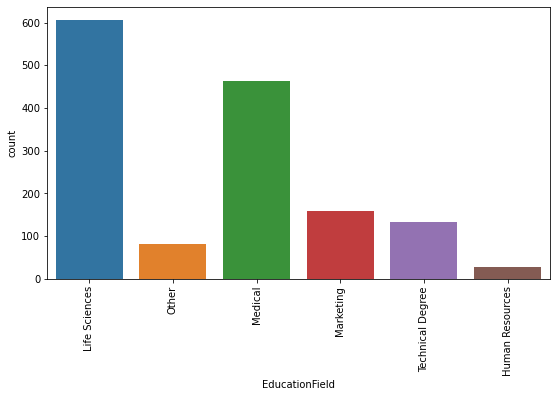

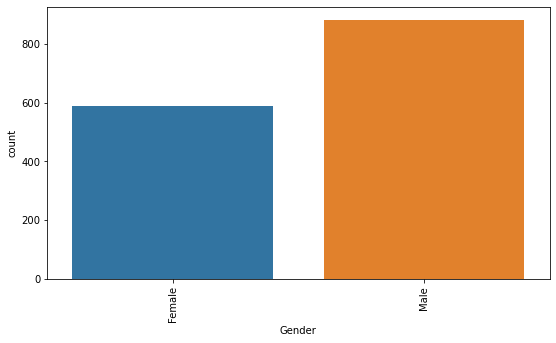

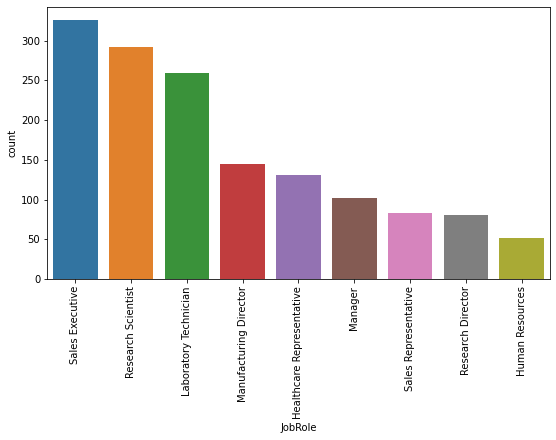

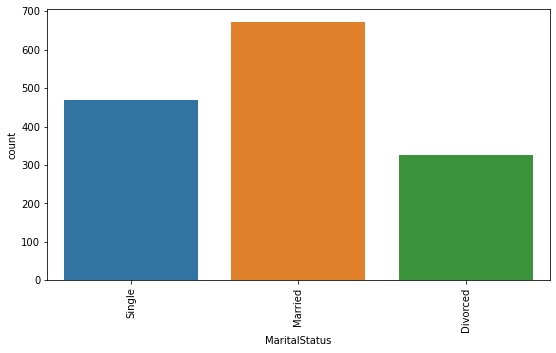

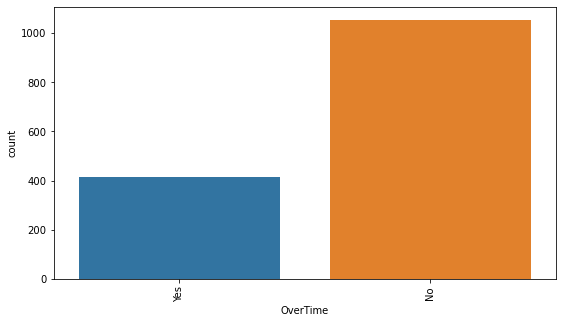

In [10]:
cat_columns=df.select_dtypes(include="object").columns
for i in cat_columns:
    plt.figure(figsize=(9,5));
    sns.countplot(df[i]);
    plt.xticks(rotation=90);
    plt.show();

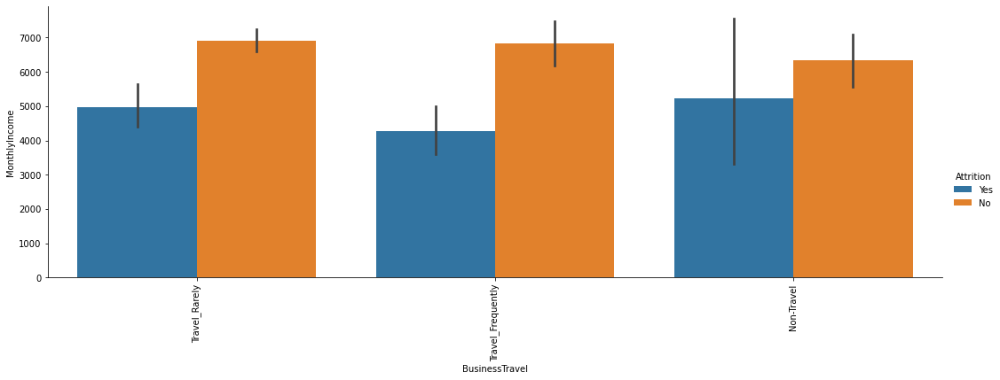

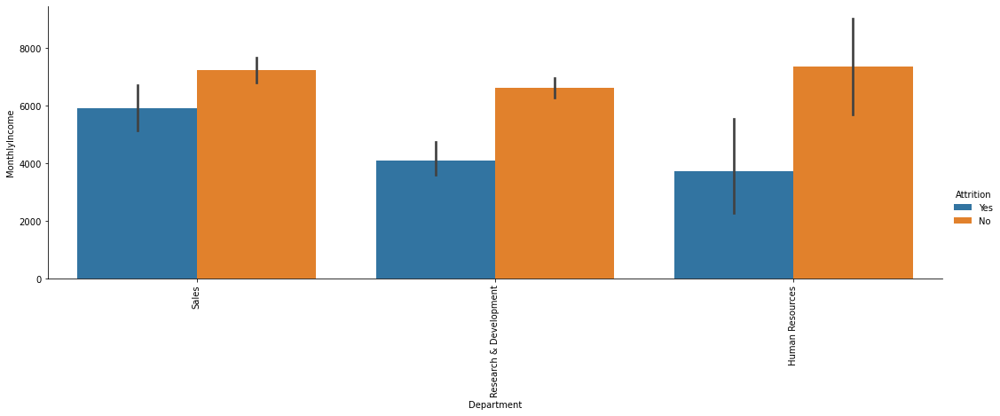

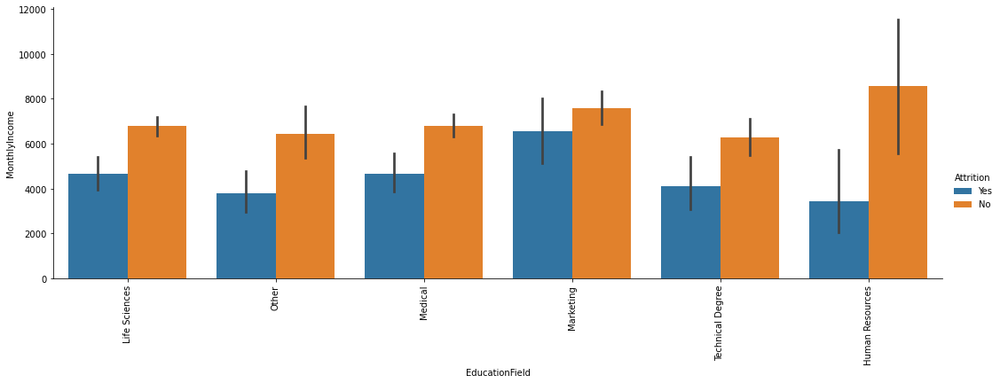

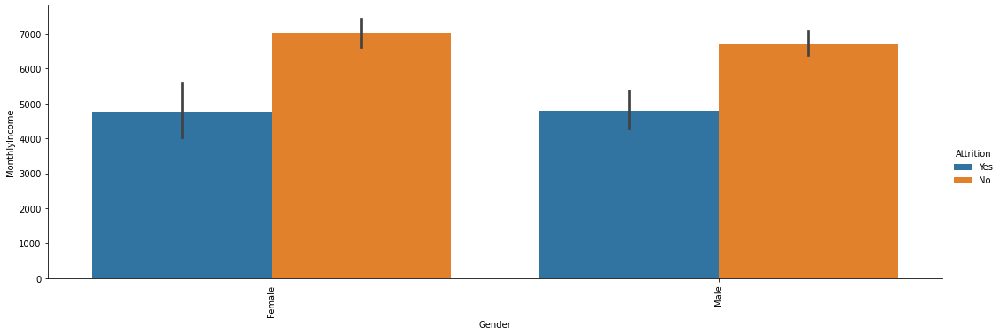

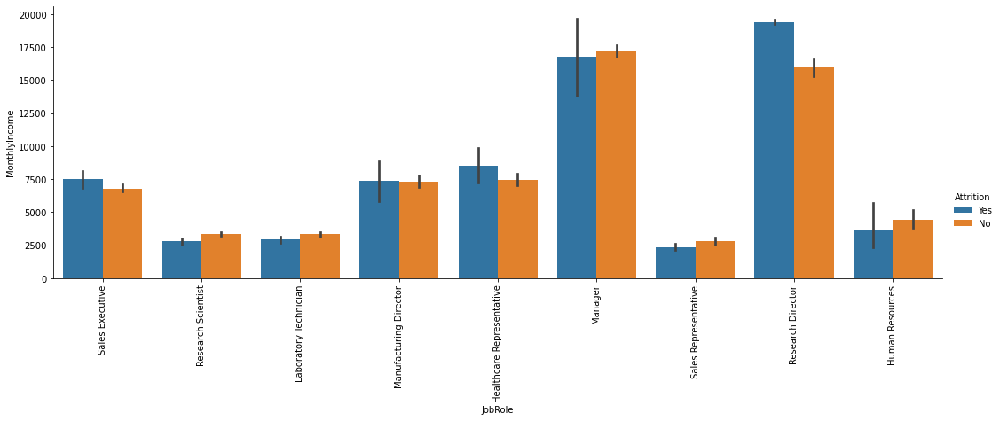

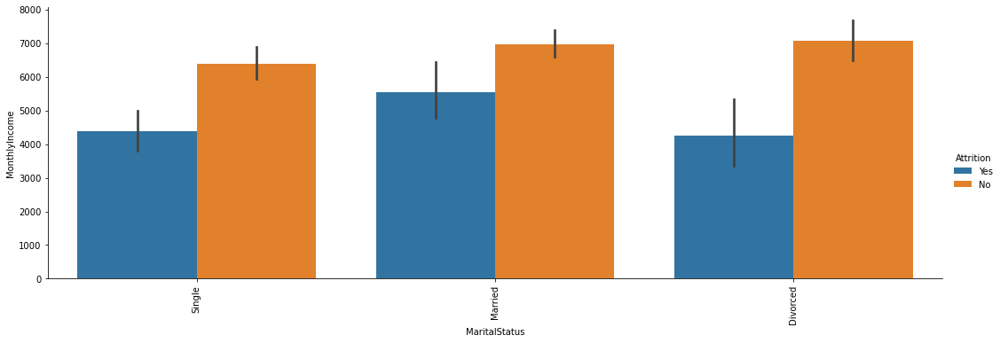

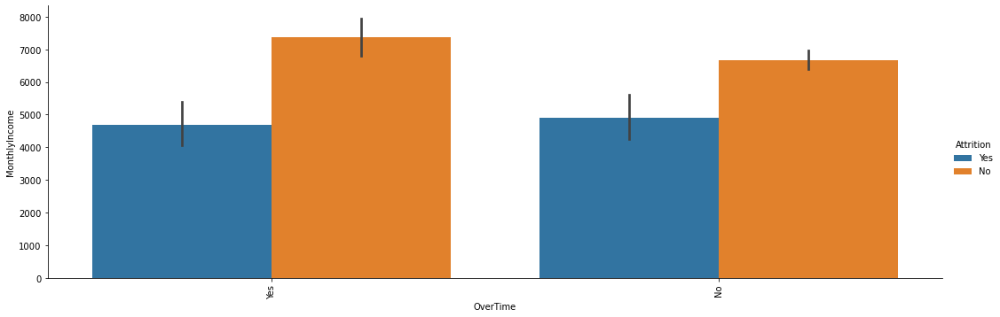

In [11]:
for i in cat_columns[1:]:
    sns.catplot(x=i,y='MonthlyIncome',hue="Attrition",data=df,kind="bar",aspect=3);
    plt.xticks(rotation=90);

In [12]:
def diagnostic_plots(df, variable):
    
    plt.figure(figsize=(20, 9))

    plt.subplot(1, 3, 1)
    sns.distplot(df[variable], bins=30,kde_kws={'bw': 1.5})
    plt.title('Histogram')
    
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('RM quantiles')

    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')

    
    
    plt.show()

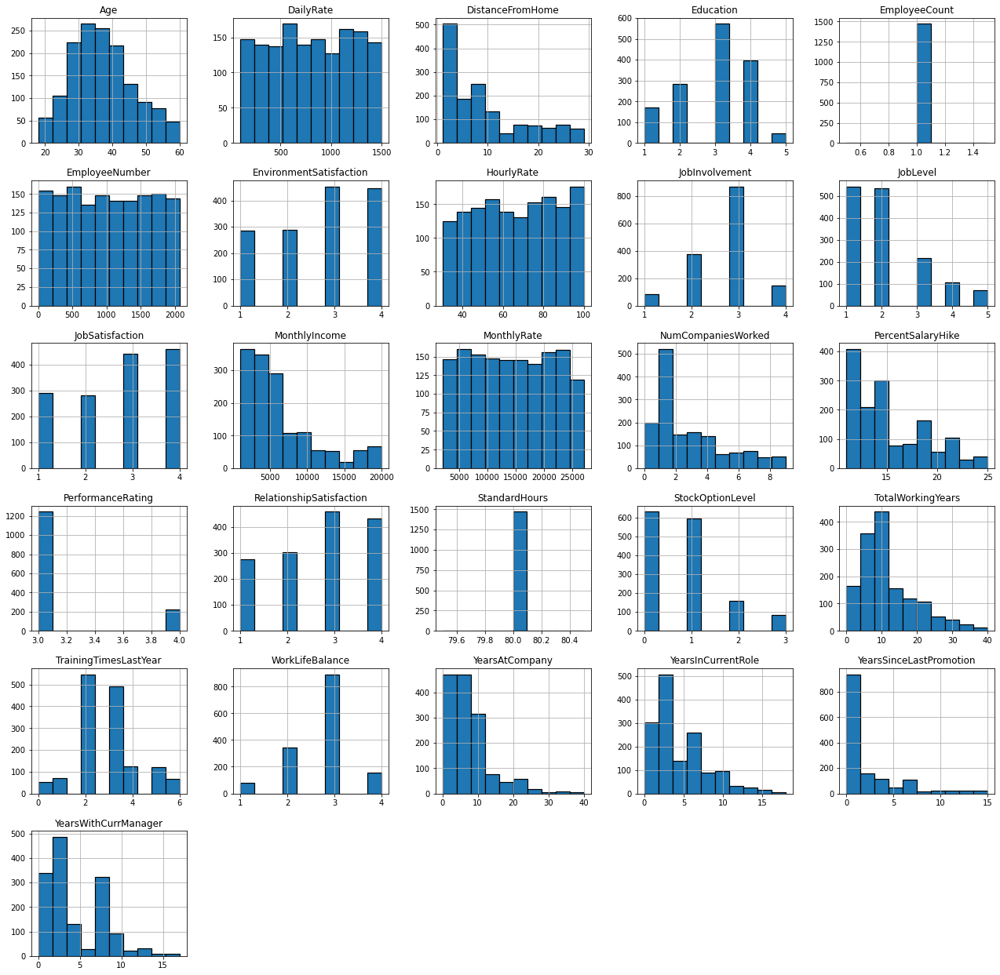

In [13]:
df.hist(edgecolor='black', linewidth=1.2, figsize=(22, 22));

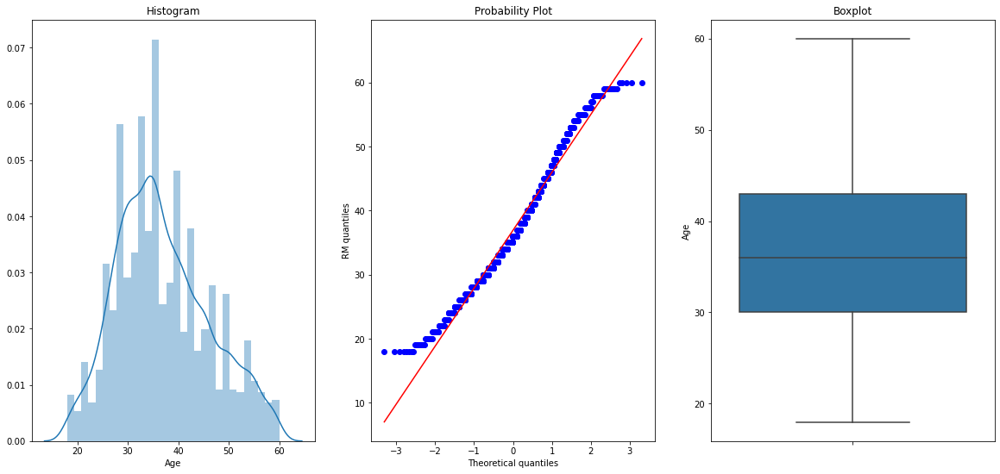

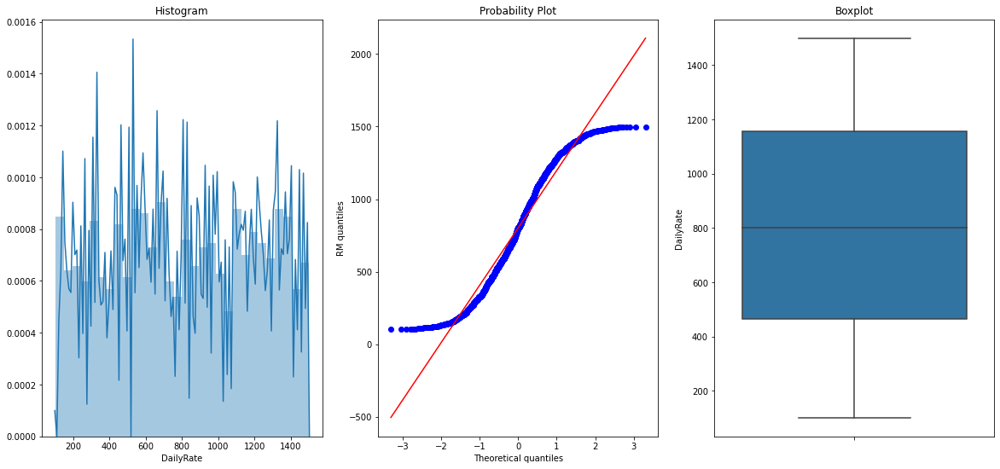

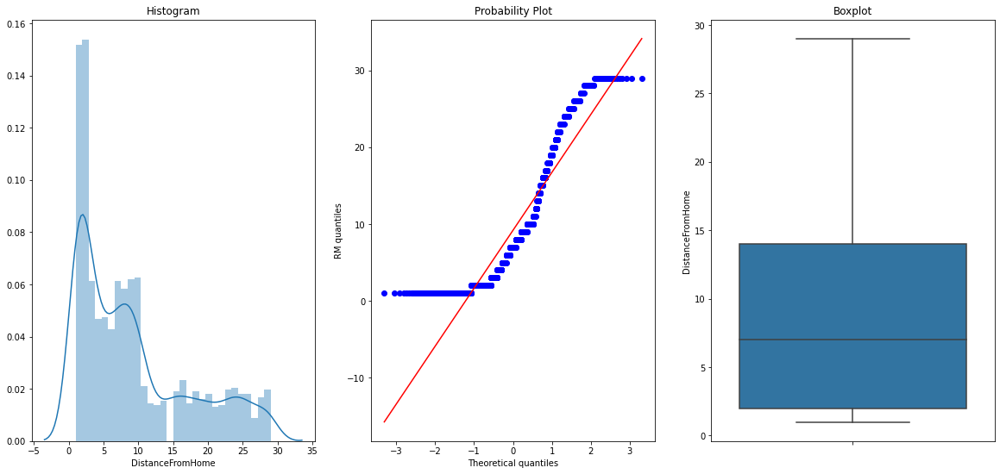

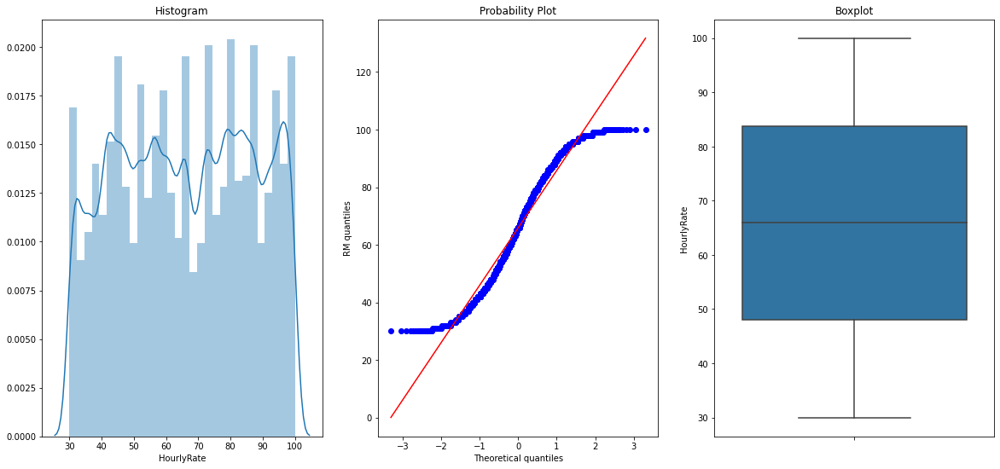

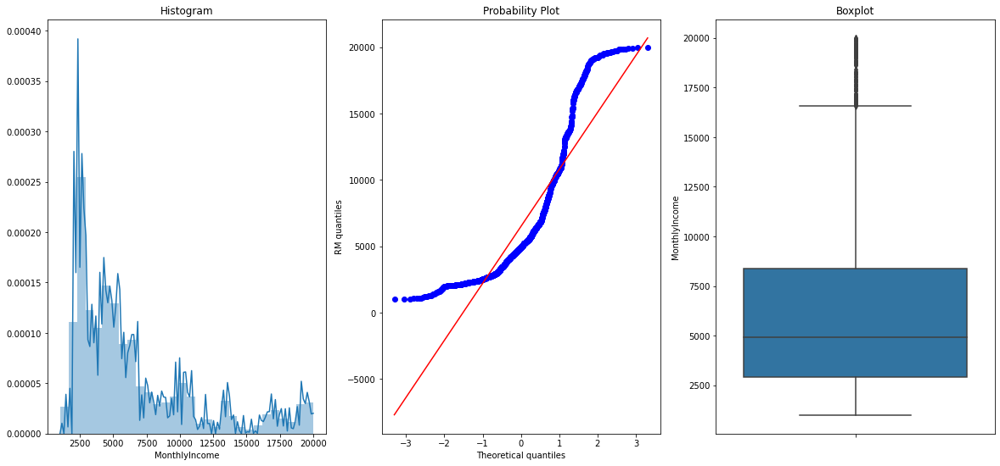

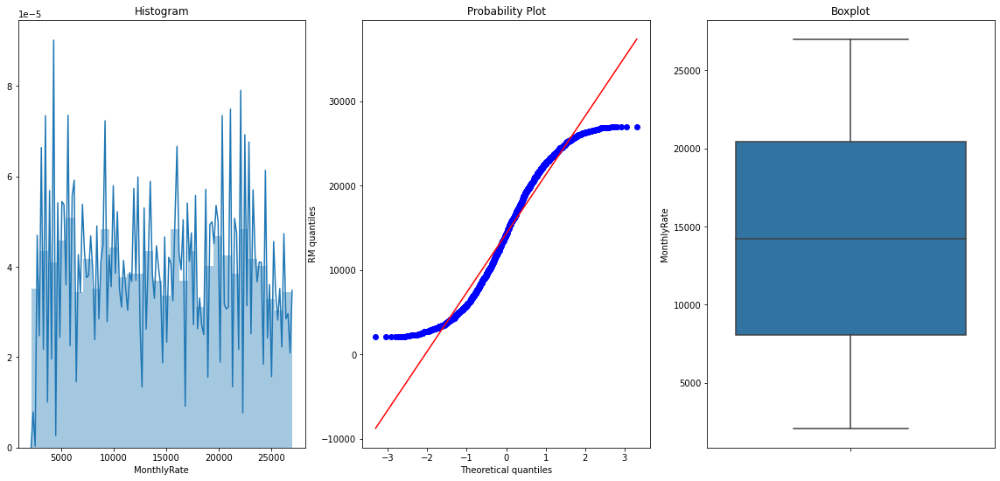

In [14]:
for i in ["Age","DailyRate","DistanceFromHome","HourlyRate","MonthlyIncome","MonthlyRate"]:
       diagnostic_plots(df,i)

In [15]:
df.dtypes.to_frame()

,0
Age,int64
Attrition,object
BusinessTravel,object
DailyRate,int64
Department,object
DistanceFromHome,int64
Education,int64
EducationField,object
EmployeeCount,int64
EmployeeNumber,int64


In [16]:
df["EmployeeCount"].value_counts()

1    1470
Name: EmployeeCount, dtype: int64

In [17]:
df["StandardHours"].value_counts()

80    1470
Name: StandardHours, dtype: int64

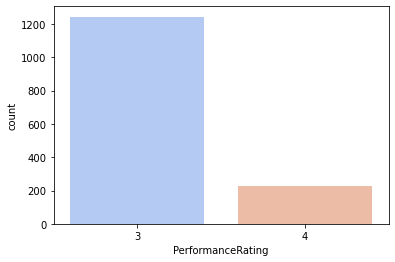

In [18]:
sns.countplot(df["PerformanceRating"],palette="coolwarm");

In [19]:
df=df.drop(columns=["EmployeeCount","StandardHours"],axis=1)

In [20]:
num_columns=df.select_dtypes(exclude="object").columns

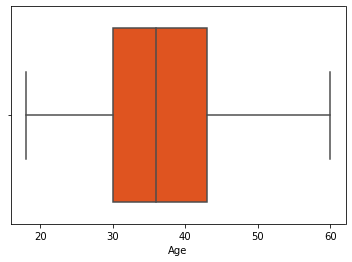

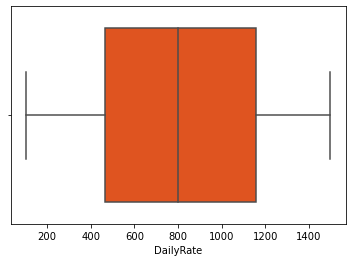

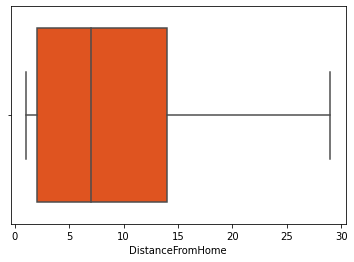

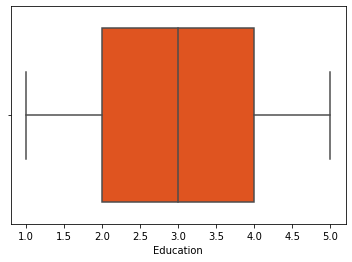

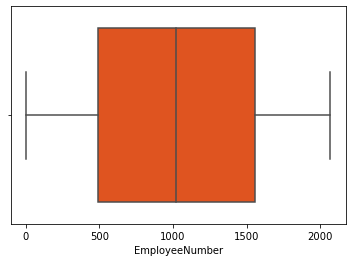

...

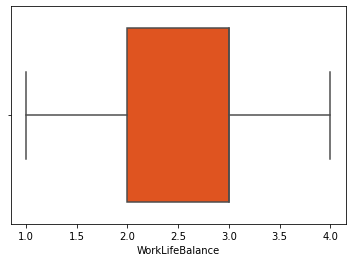

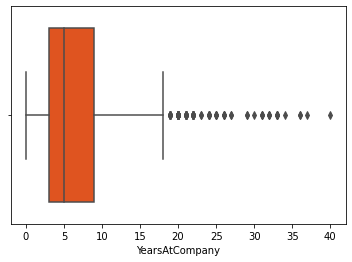

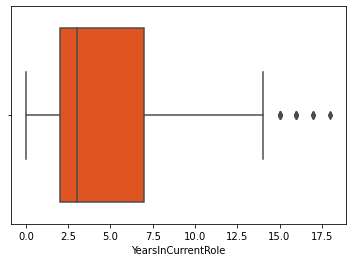

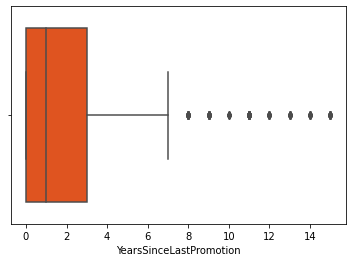

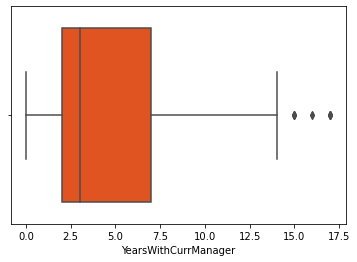

In [21]:
for i in num_columns:
    sns.boxplot(df[i],color="orangered");
    plt.show();

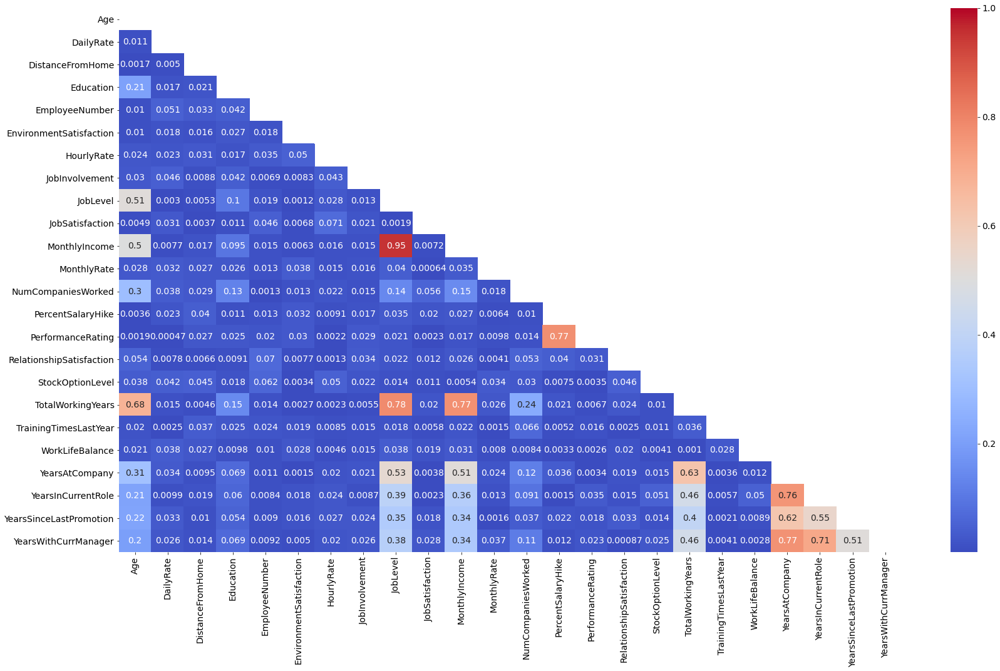

In [22]:
plt.rcParams.update({'font.size': 14})
plt.figure(figsize=(28,16))
corr=df.corr()
mask=np.zeros_like(corr,dtype=np.bool)
mask[np.triu_indices_from(mask)]=True
sns.heatmap(corr.abs(),annot=True,cmap="coolwarm",mask=mask);

In [23]:
def cramers_v(confusion_matrix):
    chi2 = stats.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))    
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))

In [24]:
cat_columns

Index(['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender',
       'JobRole', 'MaritalStatus', 'OverTime'],
      dtype='object')

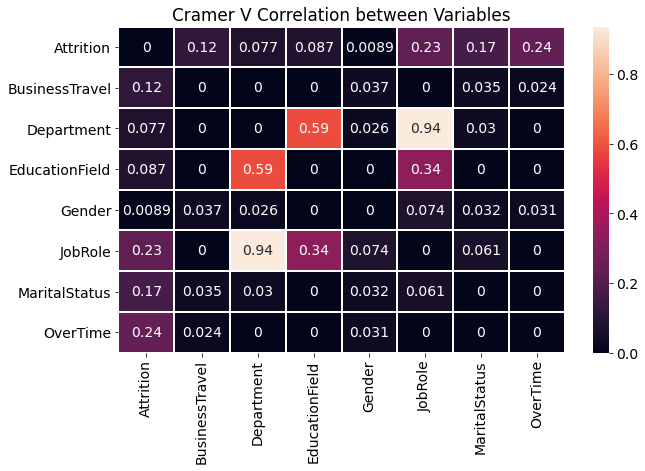

In [25]:
corrM = np.zeros((len(cat_columns),len(cat_columns)))
for col1, col2 in itertools.combinations(cat_columns, 2):
    idx1, idx2 = cat_columns.tolist().index(col1), cat_columns.tolist().index(col2)
    corrM[idx1, idx2] = cramers_v(pd.crosstab(df[col1], df[col2]))
    corrM[idx2, idx1] = corrM[idx1, idx2]
corr = pd.DataFrame(corrM, index=cat_columns, columns=cat_columns)
fig, ax = plt.subplots(figsize=(10, 6))

ax = sns.heatmap(corr, annot=True, ax=ax,linecolor="white",linewidths=1); ax.set_title("Cramer V Correlation between Variables");

In [26]:
df["EmployeeNumber"].nunique()

1470

In [27]:
df=df.drop("EmployeeNumber",axis=1)

In [28]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2


In [29]:
df_new=df.copy()
df_new=df_new.drop(columns=["Department","JobLevel","YearsInCurrentRole","TotalWorkingYears","PercentSalaryHike","YearsWithCurrManager"],axis=1)

## XGBOOST MODEL

In [30]:
df_new=pd.get_dummies(df_new,drop_first=True)

In [31]:
df_new.head()

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsSinceLastPromotion,Attrition_Yes,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Male,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,41,1102,1,2,2,94,3,4,5993,19479,8,3,1,0,0,1,6,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1
1,49,279,8,1,3,61,2,2,5130,24907,1,4,4,1,3,3,10,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0
2,37,1373,2,2,4,92,2,3,2090,2396,6,3,2,0,3,3,0,0,1,0,1,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,1
3,33,1392,3,4,4,56,3,3,2909,23159,1,3,3,0,3,3,8,3,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1
4,27,591,2,1,1,40,3,2,3468,16632,9,3,4,1,3,3,2,2,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0


In [32]:
X=df_new.drop("Attrition_Yes",axis=1)
y=df_new["Attrition_Yes"]

In [33]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.20, 
                                                    random_state=42)

In [34]:
xgb_model = XGBClassifier()
xgb_model.fit(X_train, y_train)
y_pred = xgb_model.predict(X_test)
accuracy_score(y_test,y_pred)

0.8707482993197279

In [35]:
cross_val_score(xgb_model,X,y).mean()

0.8700680272108844

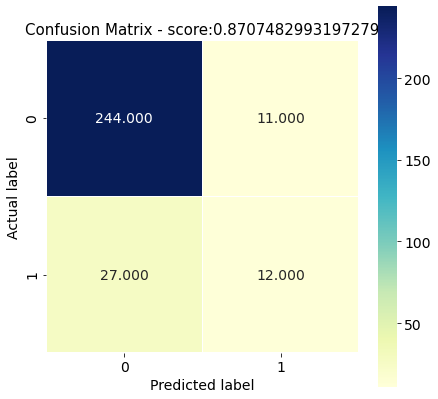

              precision    recall  f1-score   support

           0       0.90      0.96      0.93       255
           1       0.52      0.31      0.39        39

    accuracy                           0.87       294
   macro avg       0.71      0.63      0.66       294
weighted avg       0.85      0.87      0.86       294



In [36]:
def conf_matrix(y_test,y_pred):
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(7,7))
    sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'YlGnBu');
    plt.ylabel('Actual label');
    plt.xlabel('Predicted label');
    all_sample_title = 'Confusion Matrix - score:'+str(accuracy_score(y_test,y_pred))
    plt.title(all_sample_title, size = 15);
    plt.show()
    print(classification_report(y_test,y_pred))
conf_matrix(y_test,y_pred)

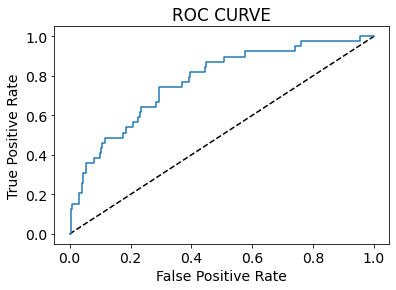

In [37]:
def plot_roc_curve(y_test,X_test,model):
    fpr_mlp, tpr_mlp, thresholds_mlp = roc_curve(y_test, model.predict_proba(X_test)[:,1])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.plot(fpr_mlp, tpr_mlp)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC CURVE')
    plt.show()
plot_roc_curve(y_test,X_test,xgb_model)

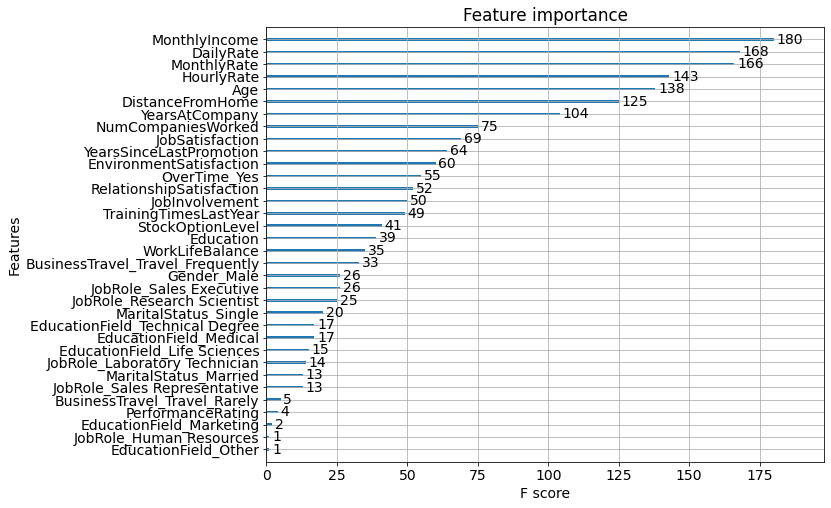

In [38]:
plot_importance(xgb_model).figure.set_size_inches(10,8);

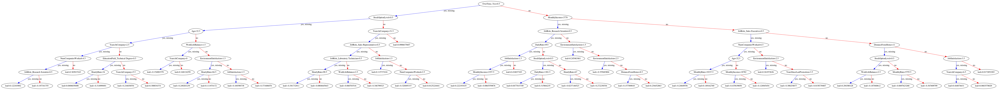

In [39]:
plot_tree(xgb_model,num_trees=2).figure.set_size_inches(200,200);
plt.show();

## UNDERSAMPLING-XGBOOST MODEL

In [40]:

rus = RandomUnderSampler(random_state=0)
X_resampled, y_resampled = rus.fit_resample(X, y)

In [41]:
X_resampled.shape,y_resampled.shape

((474, 37), (474,))

In [42]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, 
                                                    test_size=0.20, 
                                                    random_state=42)

In [43]:
xgb_model = XGBClassifier()
xgb_model.fit(X_train, y_train)
y_pred = xgb_model.predict(X_test)
accuracy_score(y_test,y_pred)

0.7684210526315789

In [44]:
cross_val_score(xgb_model,X_resampled,y_resampled).mean()

0.7319148936170212

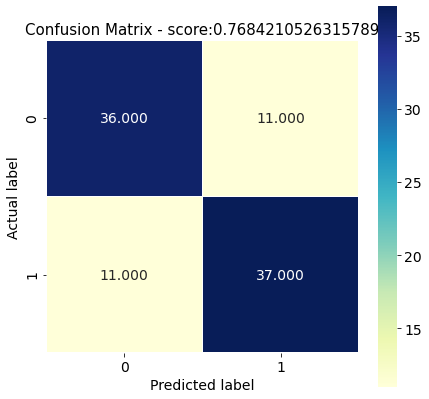

              precision    recall  f1-score   support

           0       0.77      0.77      0.77        47
           1       0.77      0.77      0.77        48

    accuracy                           0.77        95
   macro avg       0.77      0.77      0.77        95
weighted avg       0.77      0.77      0.77        95



In [45]:
conf_matrix(y_test,y_pred)

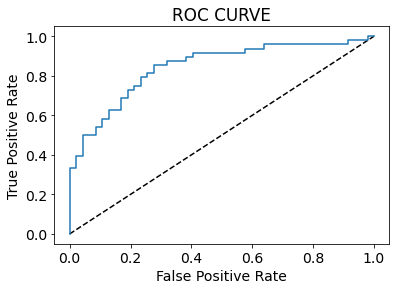

In [46]:
plot_roc_curve(y_test,X_test,xgb_model)

In [47]:
roc_auc_score(y_test,y_pred)

0.7683953900709221

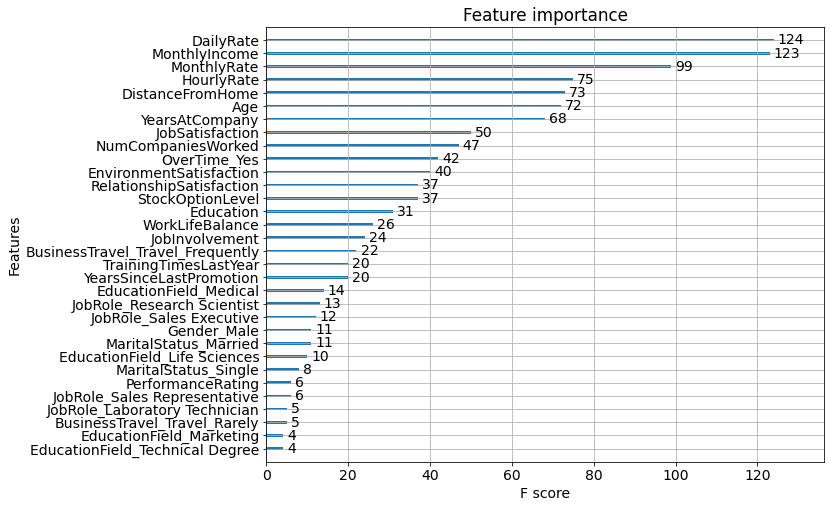

In [48]:
plot_importance(xgb_model).figure.set_size_inches(10,8);

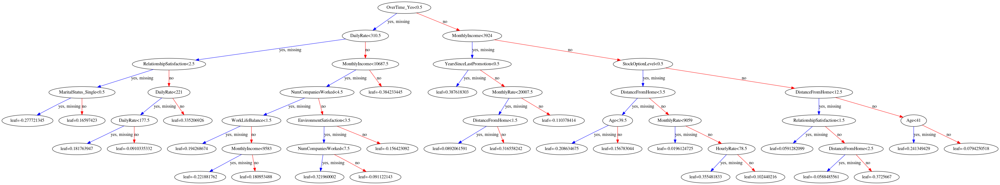

In [49]:
plot_tree(xgb_model,num_trees=2).figure.set_size_inches(200,200);
plt.show();

## OVERSAMPLING-XGBOOST

In [50]:

ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(X, y)

In [51]:
X_resampled.shape,y_resampled.shape

((2466, 37), (2466,))

In [52]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, 
                                                    test_size=0.20, 
                                                    random_state=42)

In [53]:
xgb_model = XGBClassifier()
xgb_model.fit(X_train, y_train)
y_pred = xgb_model.predict(X_test)
accuracy_score(y_test,y_pred)

0.9615384615384616

In [54]:
cross_val_score(xgb_model,X_resampled,y_resampled).mean()

0.9679636366622596

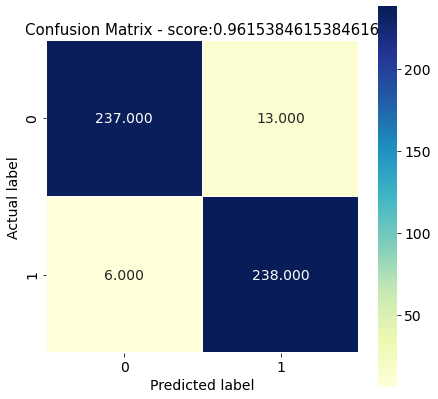

              precision    recall  f1-score   support

           0       0.98      0.95      0.96       250
           1       0.95      0.98      0.96       244

    accuracy                           0.96       494
   macro avg       0.96      0.96      0.96       494
weighted avg       0.96      0.96      0.96       494



In [55]:
conf_matrix(y_test,y_pred)

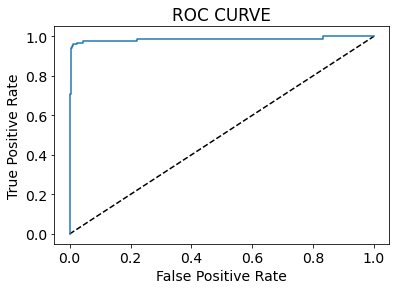

In [56]:
plot_roc_curve(y_test,X_test,xgb_model)

In [57]:
roc_auc_score(y_test,y_pred)

0.9617049180327868

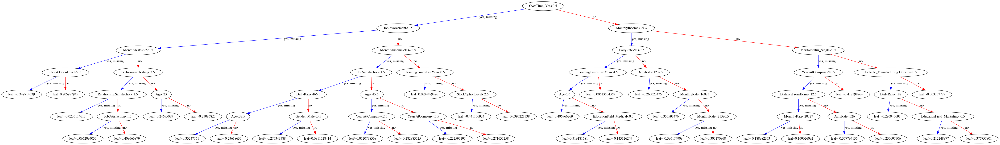

In [58]:
#%matplotlib inline
#%config InlineBackend.figure_format = 'retina'
plot_tree(xgb_model,num_trees=2).figure.set_size_inches(200,200);
plt.show();


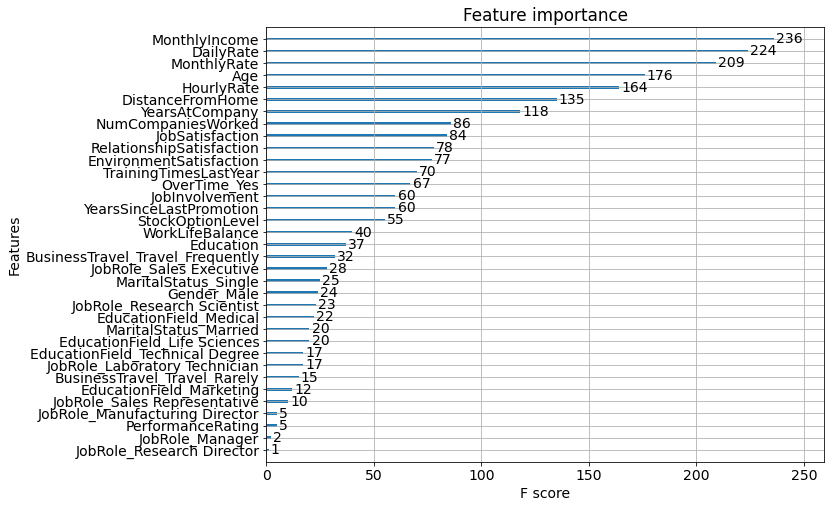

In [59]:

plot_importance(xgb_model).figure.set_size_inches(10,8);

## RANDOM FOREST MODEL

In [60]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.20, 
                                                    random_state=42)

In [61]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)

RandomForestClassifier()

In [62]:
y_pred = rf_model.predict(X_test)
accuracy_score(y_test, y_pred)

0.8673469387755102

In [63]:
cross_val_score(rf_model,X,y).mean()

0.8564625850340135

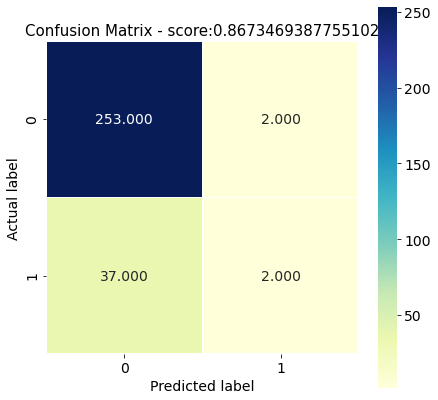

              precision    recall  f1-score   support

           0       0.87      0.99      0.93       255
           1       0.50      0.05      0.09        39

    accuracy                           0.87       294
   macro avg       0.69      0.52      0.51       294
weighted avg       0.82      0.87      0.82       294



In [64]:
conf_matrix(y_test,y_pred)

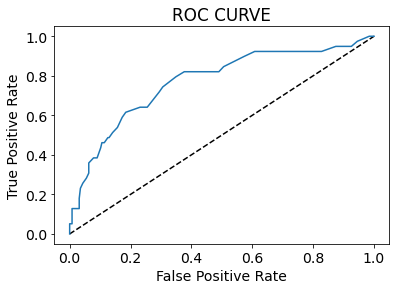

In [65]:
plot_roc_curve(y_test,X_test,rf_model)

## RANDOM FOREST-UNDERSAMPLING

In [66]:
rus = RandomUnderSampler(random_state=0)
X_resampled, y_resampled = rus.fit_resample(X, y)

In [67]:
X_resampled.shape,y_resampled.shape

((474, 37), (474,))

In [68]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, 
                                                    test_size=0.20, 
                                                    random_state=42)
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)

RandomForestClassifier()

In [69]:
y_pred = rf_model.predict(X_test)
accuracy_score(y_test, y_pred)

0.7789473684210526

In [70]:
cross_val_score(rf_model,X_resampled,y_resampled).mean()

0.7172452407614782

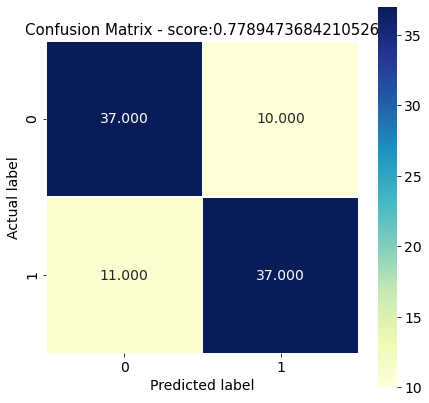

              precision    recall  f1-score   support

           0       0.77      0.79      0.78        47
           1       0.79      0.77      0.78        48

    accuracy                           0.78        95
   macro avg       0.78      0.78      0.78        95
weighted avg       0.78      0.78      0.78        95



In [71]:
conf_matrix(y_test,y_pred)

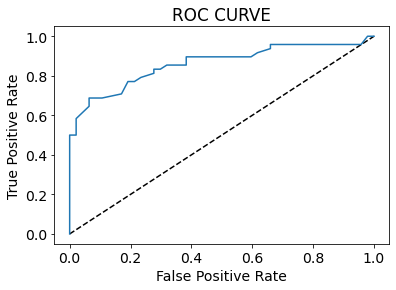

In [72]:
plot_roc_curve(y_test,X_test,rf_model)

In [73]:
roc_auc_score(y_test,y_pred)

0.7790336879432624

## RANDOM FOREST - OVERSAMPLING

In [74]:
ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(X, y)

In [75]:
X_resampled.shape, y_resampled.shape

((2466, 37), (2466,))

In [76]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, 
                                                    test_size=0.20, 
                                                    random_state=42)

In [77]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)

RandomForestClassifier()

In [78]:
y_pred = rf_model.predict(X_test)
accuracy_score(y_test, y_pred)

0.9554655870445344

In [79]:
cross_val_score(rf_model,X_resampled,y_resampled).mean()

0.9878353630995885

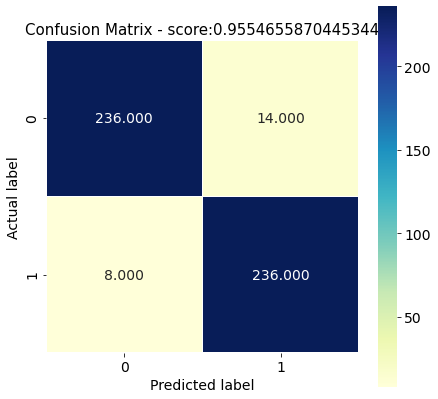

              precision    recall  f1-score   support

           0       0.97      0.94      0.96       250
           1       0.94      0.97      0.96       244

    accuracy                           0.96       494
   macro avg       0.96      0.96      0.96       494
weighted avg       0.96      0.96      0.96       494



In [80]:
conf_matrix(y_test,y_pred)

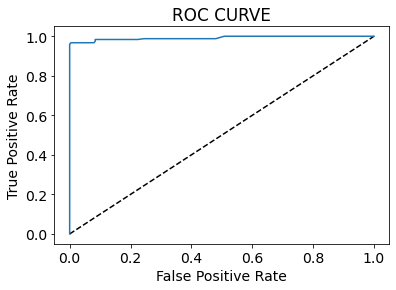

In [81]:
plot_roc_curve(y_test,X_test,rf_model)

 **I'm trying to improve myself so I'm open all your idea.Please write your suggestions for me in the comments! :)**